In [1]:
import ccxt
import numpy as np
import pandas as pd
import datetime as dt
from dateutil import tz
import matplotlib.pyplot as plt

import json
import time
import os
import sys

In [2]:
src_path = '../src/'
sys.path.append(os.path.abspath(src_path))
import func_get
import func_signal
import func_backtest

In [3]:
start_ts = time.time()

In [4]:
interval_dict = {
    '1m': 1,
    '5m': 5,
    '15m': 15,
    '30m': 30,
    '1h': 60,
    '2h': 120,
    '4h': 240,
    '1d': 1440
}

In [5]:
with open('../../../_keys/ftx/ftx_read_keys.json') as keys_file:
    keys_dict = json.load(keys_file)
    
exchange = ccxt.ftx({'apiKey': keys_dict['apiKey'],
                     'secret': keys_dict['secret'],
                     'enableRateLimit': True})

### Config

In [6]:
project_name = 'cryptoris_15m'

In [7]:
start_date = dt.datetime(2022, 1, 1)
start_hour = 0
end_date = dt.datetime.today() - dt.timedelta(days=1)
reinvest_profit_flag = True

In [8]:
config_params = {
    'safety_ohlcv_range': 1000,
    'action_timeframe': '15m',
    'target_side': ['buy', 'sell'],
    'base': {
        'symbol': ['ETH-PERP', 'SOL-PERP', 'LUNA-PERP'],
        'open': {
            '15m': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side_change'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            },
            '1h': {
                'ema': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'windows': 200,
                    'revert': False
                },
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }    
            
        },
        'close': {
            '15m': {
                'supertrend': {
                    'check': ['check_signal_side'],
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                },
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }    
            }
        }
    },
    'lead': {
        'symbol': ['BTC-PERP'],
        'open': {
            '15m': {
                'wt': {
                    'check': ['check_signal_band'],
                    'trigger': 'inner',
                    'channel_range': 10,
                    'average_range': 21,
                    'overbought': 53,
                    'oversold': -53,
                    'revert': False
                }
            }
        },
        'close': {
        }
    },
    'tp': {
        'stop_percent': 50,
        'price_percent': 5,
        'signal': None,
    },
    'sl': {
        'stop_percent': 50,
        'price_percent': None,
        'signal': {
            'timeframe': '15m',
            'signal': {
                'supertrend': {
                    'look_back': 1,
                    'atr_range': 10,
                    'multiplier': 3,
                    'revert': False
                }
            }
        }
    },
    'action_percent': 10,
    'leverage': 5,
    'taker_fee_percent': 0.07
}

### Get data

In [9]:
ohlcv_df_dict = func_get.get_data(exchange, start_date, end_date, start_hour, interval_dict, config_params)

base: timeframe 1/2 symbol 1/3 date 1/161
base: timeframe 1/2 symbol 1/3 date 2/161
base: timeframe 1/2 symbol 1/3 date 3/161
base: timeframe 1/2 symbol 1/3 date 4/161
base: timeframe 1/2 symbol 1/3 date 5/161
base: timeframe 1/2 symbol 1/3 date 6/161
base: timeframe 1/2 symbol 1/3 date 7/161
base: timeframe 1/2 symbol 1/3 date 8/161
base: timeframe 1/2 symbol 1/3 date 9/161
base: timeframe 1/2 symbol 1/3 date 10/161
base: timeframe 1/2 symbol 1/3 date 11/161
base: timeframe 1/2 symbol 1/3 date 12/161
base: timeframe 1/2 symbol 1/3 date 13/161
base: timeframe 1/2 symbol 1/3 date 14/161
base: timeframe 1/2 symbol 1/3 date 15/161
base: timeframe 1/2 symbol 1/3 date 16/161
base: timeframe 1/2 symbol 1/3 date 17/161
base: timeframe 1/2 symbol 1/3 date 18/161
base: timeframe 1/2 symbol 1/3 date 19/161
base: timeframe 1/2 symbol 1/3 date 20/161
base: timeframe 1/2 symbol 1/3 date 21/161
base: timeframe 1/2 symbol 1/3 date 22/161
base: timeframe 1/2 symbol 1/3 date 23/161
base: timeframe 1/2 

base: timeframe 1/2 symbol 2/3 date 31/161
base: timeframe 1/2 symbol 2/3 date 32/161
base: timeframe 1/2 symbol 2/3 date 33/161
base: timeframe 1/2 symbol 2/3 date 34/161
base: timeframe 1/2 symbol 2/3 date 35/161
base: timeframe 1/2 symbol 2/3 date 36/161
base: timeframe 1/2 symbol 2/3 date 37/161
base: timeframe 1/2 symbol 2/3 date 38/161
base: timeframe 1/2 symbol 2/3 date 39/161
base: timeframe 1/2 symbol 2/3 date 40/161
base: timeframe 1/2 symbol 2/3 date 41/161
base: timeframe 1/2 symbol 2/3 date 42/161
base: timeframe 1/2 symbol 2/3 date 43/161
base: timeframe 1/2 symbol 2/3 date 44/161
base: timeframe 1/2 symbol 2/3 date 45/161
base: timeframe 1/2 symbol 2/3 date 46/161
base: timeframe 1/2 symbol 2/3 date 47/161
base: timeframe 1/2 symbol 2/3 date 48/161
base: timeframe 1/2 symbol 2/3 date 49/161
base: timeframe 1/2 symbol 2/3 date 50/161
base: timeframe 1/2 symbol 2/3 date 51/161
base: timeframe 1/2 symbol 2/3 date 52/161
base: timeframe 1/2 symbol 2/3 date 53/161
base: timef

base: timeframe 1/2 symbol 3/3 date 60/161
base: timeframe 1/2 symbol 3/3 date 61/161
base: timeframe 1/2 symbol 3/3 date 62/161
base: timeframe 1/2 symbol 3/3 date 63/161
base: timeframe 1/2 symbol 3/3 date 64/161
base: timeframe 1/2 symbol 3/3 date 65/161
base: timeframe 1/2 symbol 3/3 date 66/161
base: timeframe 1/2 symbol 3/3 date 67/161
base: timeframe 1/2 symbol 3/3 date 68/161
base: timeframe 1/2 symbol 3/3 date 69/161
base: timeframe 1/2 symbol 3/3 date 70/161
base: timeframe 1/2 symbol 3/3 date 71/161
base: timeframe 1/2 symbol 3/3 date 72/161
base: timeframe 1/2 symbol 3/3 date 73/161
base: timeframe 1/2 symbol 3/3 date 74/161
base: timeframe 1/2 symbol 3/3 date 75/161
base: timeframe 1/2 symbol 3/3 date 76/161
base: timeframe 1/2 symbol 3/3 date 77/161
base: timeframe 1/2 symbol 3/3 date 78/161
base: timeframe 1/2 symbol 3/3 date 79/161
base: timeframe 1/2 symbol 3/3 date 80/161
base: timeframe 1/2 symbol 3/3 date 81/161
base: timeframe 1/2 symbol 3/3 date 82/161
base: timef

base: timeframe 2/2 symbol 1/3 date 89/130
base: timeframe 2/2 symbol 1/3 date 90/130
base: timeframe 2/2 symbol 1/3 date 91/130
base: timeframe 2/2 symbol 1/3 date 92/130
base: timeframe 2/2 symbol 1/3 date 93/130
base: timeframe 2/2 symbol 1/3 date 94/130
base: timeframe 2/2 symbol 1/3 date 95/130
base: timeframe 2/2 symbol 1/3 date 96/130
base: timeframe 2/2 symbol 1/3 date 97/130
base: timeframe 2/2 symbol 1/3 date 98/130
base: timeframe 2/2 symbol 1/3 date 99/130
base: timeframe 2/2 symbol 1/3 date 100/130
base: timeframe 2/2 symbol 1/3 date 101/130
base: timeframe 2/2 symbol 1/3 date 102/130
base: timeframe 2/2 symbol 1/3 date 103/130
base: timeframe 2/2 symbol 1/3 date 104/130
base: timeframe 2/2 symbol 1/3 date 105/130
base: timeframe 2/2 symbol 1/3 date 106/130
base: timeframe 2/2 symbol 1/3 date 107/130
base: timeframe 2/2 symbol 1/3 date 108/130
base: timeframe 2/2 symbol 1/3 date 109/130
base: timeframe 2/2 symbol 1/3 date 110/130
base: timeframe 2/2 symbol 1/3 date 111/130

base: timeframe 2/2 symbol 3/3 date 19/130
base: timeframe 2/2 symbol 3/3 date 20/130
base: timeframe 2/2 symbol 3/3 date 21/130
base: timeframe 2/2 symbol 3/3 date 22/130
base: timeframe 2/2 symbol 3/3 date 23/130
base: timeframe 2/2 symbol 3/3 date 24/130
base: timeframe 2/2 symbol 3/3 date 25/130
base: timeframe 2/2 symbol 3/3 date 26/130
base: timeframe 2/2 symbol 3/3 date 27/130
base: timeframe 2/2 symbol 3/3 date 28/130
base: timeframe 2/2 symbol 3/3 date 29/130
base: timeframe 2/2 symbol 3/3 date 30/130
base: timeframe 2/2 symbol 3/3 date 31/130
base: timeframe 2/2 symbol 3/3 date 32/130
base: timeframe 2/2 symbol 3/3 date 33/130
base: timeframe 2/2 symbol 3/3 date 34/130
base: timeframe 2/2 symbol 3/3 date 35/130
base: timeframe 2/2 symbol 3/3 date 36/130
base: timeframe 2/2 symbol 3/3 date 37/130
base: timeframe 2/2 symbol 3/3 date 38/130
base: timeframe 2/2 symbol 3/3 date 39/130
base: timeframe 2/2 symbol 3/3 date 40/130
base: timeframe 2/2 symbol 3/3 date 41/130
base: timef

lead: timeframe 1/1 symbol 1/1 date 81/130
lead: timeframe 1/1 symbol 1/1 date 82/130
lead: timeframe 1/1 symbol 1/1 date 83/130
lead: timeframe 1/1 symbol 1/1 date 84/130
lead: timeframe 1/1 symbol 1/1 date 85/130
lead: timeframe 1/1 symbol 1/1 date 86/130
lead: timeframe 1/1 symbol 1/1 date 87/130
lead: timeframe 1/1 symbol 1/1 date 88/130
lead: timeframe 1/1 symbol 1/1 date 89/130
lead: timeframe 1/1 symbol 1/1 date 90/130
lead: timeframe 1/1 symbol 1/1 date 91/130
lead: timeframe 1/1 symbol 1/1 date 92/130
lead: timeframe 1/1 symbol 1/1 date 93/130
lead: timeframe 1/1 symbol 1/1 date 94/130
lead: timeframe 1/1 symbol 1/1 date 95/130
lead: timeframe 1/1 symbol 1/1 date 96/130
lead: timeframe 1/1 symbol 1/1 date 97/130
lead: timeframe 1/1 symbol 1/1 date 98/130
lead: timeframe 1/1 symbol 1/1 date 99/130
lead: timeframe 1/1 symbol 1/1 date 100/130
lead: timeframe 1/1 symbol 1/1 date 101/130
lead: timeframe 1/1 symbol 1/1 date 102/130
lead: timeframe 1/1 symbol 1/1 date 103/130
lead: t

### Add signal

In [10]:
ohlcv_df_dict = func_signal.add_signal(start_date, ohlcv_df_dict, interval_dict, config_params)

base add ema to ETH-PERP 1h
base add supertrend to ETH-PERP 1h
base add wt to ETH-PERP 1h
base add ema to SOL-PERP 1h
base add supertrend to SOL-PERP 1h
base add wt to SOL-PERP 1h
base add ema to LUNA-PERP 1h
base add supertrend to LUNA-PERP 1h
base add wt to LUNA-PERP 1h
base add ema to ETH-PERP 15m
base add supertrend to ETH-PERP 15m
base add wt to ETH-PERP 15m
base add ema to SOL-PERP 15m
base add supertrend to SOL-PERP 15m
base add wt to SOL-PERP 15m
base add ema to LUNA-PERP 15m
base add supertrend to LUNA-PERP 15m
base add wt to LUNA-PERP 15m
lead add wt to BTC-PERP 15m


### Back test

In [11]:
action_time_list = func_get.gen_action_time_list(config_params, ohlcv_df_dict)
max_open_timeframe = func_backtest.get_max_open_timeframe(config_params, interval_dict)

In [12]:
budget = 100

transaction_dict = {
    'symbol': [],
    'side': [],
    'amount': [],
    'open_time': [],
    'open_price': [],
    'close_time': [],
    'close_price': [],
    'value': [],
    'notional': [],
    'profit': [],
    'profit_percent': []
}

position_dict = {}

if reinvest_profit_flag == True:
    budget_dict = {
        'time': [],
        'budget': []
    }
    
max_drawdown = 0

In [13]:
if reinvest_profit_flag == True:
    min_budget = budget

time_count = 0

for signal_time in action_time_list:
    action_time = signal_time + dt.timedelta(minutes=interval_dict[config_params['action_timeframe']])
    
    time_count += 1
    print(f"Time {action_time}: progress {time_count}/{len(action_time_list)}")

    '''
    Close positions
    '''
    for symbol in [x for x in position_dict.keys()]:
        print(f"  {symbol}")
        budget, max_drawdown, position_dict, transaction_dict = func_backtest.close_position(symbol, signal_time, max_drawdown, config_params, budget, reinvest_profit_flag, ohlcv_df_dict, position_dict, transaction_dict, interval_dict)

    '''
    Open positions
    '''
    max_position = int(1 / (config_params['action_percent'] / 100))

    for symbol in [x for x in config_params['base']['symbol'] if x not in position_dict.keys()][:max_position]:
        print(f"  {symbol}")
        position_dict = func_backtest.open_position(symbol, signal_time, max_open_timeframe, config_params, budget, ohlcv_df_dict, position_dict, interval_dict)    
    
    '''
    Update budget
    '''
    if reinvest_profit_flag == True:
        budget_dict['time'].append(signal_time)
        budget_dict['budget'].append(budget)

        if budget < min_budget:
            min_budget = budget

    if budget <= 0:
        print(f"Out of money at {action_time}")
        break
        
'''
Clear final position
'''
opened_symbol = list(position_dict.keys())

for symbol in opened_symbol:
    print(f" Clear {symbol} position")
    
    side = position_dict[symbol]['side']
    ohlcv_df = ohlcv_df_dict['base'][config_params['action_timeframe']][symbol]
    current_ohlcv_df = ohlcv_df[ohlcv_df['time'] == signal_time].reset_index(drop=True)
    close_price = current_ohlcv_df.loc[0, 'close']
    close_percent = 100
    
    budget, position_dict, transaction_dict = func_backtest.update_close_position(symbol, side, close_price, close_percent, signal_time, config_params, budget, reinvest_profit_flag, position_dict, transaction_dict, interval_dict)

Time 2022-01-01 00:15:00: progress 1/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUN

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 06:30:00: progress 26/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 13:00:00: progress 52/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     bas

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-01 19:00:00: progress 76/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy


     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-02 01:45:00: progress 103/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-02 07:45:00: progress 127/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_ba

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 14:30:00: progress 154/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     ba

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-02 22:30:00: progress 186/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 05:00:00: progress 212/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-03 10:45:00: progress 235/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-04 00:15:00: progress 289/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
    

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 06:30:00: progress 314/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 13:00:00: progress 340/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-04 19:15:00: progress 365/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_ban

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 01:15:00: progress 389/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 88.1437771033159
  ETH-PERP
     base ETH-PERP check_signal_side 

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 07:30:00: progress 414/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base L

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-05 20:45:00: progress 467/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base 

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-0

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_s

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-06 16:15:00: progress 545/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-06 22:30:00: progress 570/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sign

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 04:00:00: progress 592/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-07 10:45:00: progress 619/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-07 17:00:00: progress 644/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-07 23:00:00: progress 668/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 141.35379384933634
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 72.43734360029012
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_si

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 06:45:00: progress 699/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sel

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 13:15:00: progress 725/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_s

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-08 18:30:00: progress 746/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 00:45:00: progress 771/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 06:30:00: progress 794/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 13:00:00: progress 820/11424
  ETH-PERP
     base 

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-09 18:30:00: progress 842/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 00:45:00: progress 867/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-10 06:30:00: progress 890/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: bu

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-10 12:30:00: progress 914/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-10 18:30:00: progress 938/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP c

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 00:45:00: progress 963/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 06:15:00: progress 985/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LU

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-11 12:15:00: progress 1009/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     sell: 0.3825876161918411
     price: 135.3425
     tp: 128.575375
     sl: 138.09895588991617
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-11 17:45:00: progress 1031/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 137.84331030092454
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side s

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base 

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-12 11:45:00: progress 1103/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP c

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-12 18:00:00: progress 1128/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base L

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 05:30:00: progress 1174/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3331.248784120073
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-13 17:00:00: progress 1220/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_sid

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 05:15:00: progress 1269/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LU

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 11:15:00: progress 1293/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LU

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 17:15:00: progress 1317/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertr

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-14 23:30:00: progress 1342/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_si

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 04:45:00: progress 1363/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 11:30:00: progress 1390/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 148.03024130402673
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: bu

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-15 18:00:00: progress 1416/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 00:30:00: progress 1442/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
    

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-16 06:45:00: progress 1467/11424
  ETH-PERP
     base ETH

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 12:15:00: progress 1489/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-16 19:15:00: progress 1517/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_

     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 03:30:00: progress 1550/11424
  ETH-PERP
     bas

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-17 10:30:00: progress 1578/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Closed by signal at 85.35
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-17 16:00:00: progress 1600/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-17 21:45:00: progress 1623/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 09:15:00: progress 1669/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     b

     Update sl: 3208.449808997054
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-18 15:45:00: progress 1695/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3200.6348280973484
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     b

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-18 23:00:00: progress 1724/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signa

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-19 04:15:00: progress 1745/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 10:15:00: progress 1769/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base 

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-19 16:00:00: progress 1792/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-20 10:00:00: progress 1864/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-20 15:45:00: progress 1887/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-20 21:30:00: progress 1910/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-21 08:45:00: progress 1955/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-21 14:00:00: progress 1976/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-21 19:45:00: progress 1999/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_s

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-22 12:15:00: progress 2065/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PE

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_s

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-22 23:00:00: progress 2108/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-23 04:45:00: progress 2131/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_si

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 10:00:00: progress 2152/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-23 15:30:00: progress 2174/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signa

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-23 20:45:00: progress 2195/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signa

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-0

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 08:45:00: progress 2243/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 98.58717773995127
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m:

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-24 20:30:00: progress 2290/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     bas

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-25 02:30:00: progress 2314/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 07:30:00: progress 2334/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-P

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 13:00:00: progress 2356/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band w

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-25 18:15:00: progress 2377/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ban

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 00:00:00: progress 2400/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-P

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 05:15:00: progress 2421/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base L

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 15:30:00: progress 2462/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PER

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-26 21:00:00: progress 2484/11424
  ETH-PERP
     base ET

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-27 02:15:00: progress 2505/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ET

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 08:00:00: progress 2528/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_s

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 18:30:00: progress 2570/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-27 23:30:00: progress 2590/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 10:45:00: progress 2635/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     b

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-28 16:30:00: progress 2658/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUN

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-28 23:15:00: progress 2685/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 04:30:00: progress 2706/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 14:45:00: progress 2747/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-01-29 20:15:00: progress 2769/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 01:45:00: progress 2791/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 08:00:00: progress 2816/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     bas

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sign

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-30 23:45:00: progress 2879/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 05:00:00: progress 2900/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 15:45:00: progress 2943/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signa

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-01-31 20:45:00: progress 2963/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-01 02:00:00: progress 2984/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 07:00:00: progress 3004/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 12:30:00: progress 3026/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 17:15:00: progress 3045/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-01 22:45:00: progress 3067/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-P

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_si

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-02 19:15:00: progress 3149/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 00:30:00: progress 3170/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 06:15:00: progress 3193/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
  

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 11:00:00: progress 3212/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 16:30:00: progress 3234/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-03 21:15:00: progress 3253/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 07:00:00: progress 3292/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band 

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 12:15:00: progress 3313/11424
  ETH-PERP
     base ET

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 17

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-04 22:15:00: progress 3353/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend

     Update sl: 107.16131608015323
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 05:00:00: progress 3380/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2902.1375070021213
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 107.48305947213791
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 10:45:00: progress 3403/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-05 15:45:00: progress 3423/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-05 20:45:00: progress 3443/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 01:45:00: progress 3463/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 06:30:00: progress 3482/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP che

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 11:

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-06 16:45:00: progress 3523/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 08:15:00: progress 3585/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-07 13:15:00: progress 3605/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP che

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-07 18:15:00: progress 3625/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PE

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-07 23:15:00: progress 3645/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 09:15:00: progress 3685/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-08 14:00:00: progress 3704/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-08 19:00:00: progress 3724/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUN

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 00:00:00: progress 3744/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 05:00:00: progress 3764/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 20

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-09 19:45:00: progress 3823/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 00:45:00: progress 3843/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 10:30:00: progress 3882/11424
  ETH-PERP
     base ETH

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-10 15:15:00: progress 3901/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band w

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-10 20:00:00: progress 3920/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-P

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 01:15:00: progress 3941/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUN

  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 06:15:00: progress 3961/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-11 11:00:00: progress 3980/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 16:00:00: progress 4000/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
    

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-11 20:45:00: progress 4019/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_si

     sell: 0.5343074169840909
     price: 105.415
     tp: 100.14425
     sl: 108.01202073687273
Time 2022-02-12 01:45:00: progress 4039/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 106.86756866318544
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 02:00:00: progress 4040/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP 

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 11:45:00: progress 4079/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_s

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-12 16:15:00: progress 4097/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-13 01:00:00: progress 4132/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-02-13 05:30:00: progress 4150/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-02-13 05:45:00: progress 4151/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP che

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 12:15:00: progress 4177/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No actio

  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-13 18:30:00: progress 4202/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_s

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 00:15:00: progress 4225/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2931.7489865475454
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 05:15:00: progress 4245/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 10:00:00: progress 4264/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 14:30:00: progress 4282/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base L

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-14 19:45:00: progress 4303/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     base ET

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 00:30:00: progress 4322/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 05:45:00: progress 4343/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-15 15:15:00: progress 4381/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP chec

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 00:45:00: progress 4419/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 05:30:00: progress 4438/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 

     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-16 11:00:00: progress 4460/11424
  SOL-PERP
     ba

     Update sl: 102.21196787313767
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: sell
     Closed by signal at 57.661
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 01:15:00: progress 4517/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     ba

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 06:30:00: progress 4538/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
  

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-17 11:45:00: progress 4559/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.5575344469189586
     price: 99.0775
     tp: 94.12362499999999
     sl: 101.27549387875541
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-17 16:30:00: progress 4578/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 100.91157503761269
  ETH-PERP


     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-17 22:00:00: progress 4600/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 07:15:00: progress 4637/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-18 12:00:00: progress 4656/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-18 16:30:00: progress 4674/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sig

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-18 22:30:00: progress 4698/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: buy
     Closed by signal at 49.

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 03:00:00: progress 4716/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 07:30:00: progress 4734/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     bas

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-19 12:15:00: progress 4753/11424
  ETH-PERP
     b

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-19 16:45:00: progress 4771/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell


     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 02:15:00: progress 4809/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_sig

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-20 06:45:00: progress 4827/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 11:45:00: progress 4847/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 2688.6
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-20 15:45:00: progress 4863/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 00:30:00: progress 4898/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_sign

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2634.055152981368
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 05:00:00: progress 4916/11424
  ETH-PERP
     base ETH-PERP check

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-21 17:45:00: progress 4967/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-21 22:15:00: progress 4985/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supert

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 02:45:00: progress 5003/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 03:00:00: progress 5004/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP ch

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 07:45:00: progress 5023/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base L

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-22 12:00:00: progress 5040/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sign

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 16:15:00: progress 5057/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-22 20:45:00: progress 5075/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ET

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-23 00:45:00: progress 5091/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supe

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 09:15:00: progress 5125/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 53.935370671468434
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_si

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 13:45:00: progress 5143/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_si

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-23 22:30:00: progress 5178/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: bu

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP c

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-24 15:45:00: progress 5247/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 202

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-25 04:30:00: progress 5298/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 12:45:00: progress 5331/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 17:00:00: progress 5348/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-P

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-25 21:30:00: progress 5366/11424
  LUNA-PERP
     base L

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 06:00:00: progress 5400/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 10:00:00: progress 5416/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 14:15:00: progress 5433/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-26 18:30:00: progress 5450/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-26 22:45:00: progress 5467/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP che

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-02-27 03:00:00: progress 5484/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 07:45:00: progress 5503/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PER

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 16:30:00: progress 5538/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-27 21:00:00: progress 5556/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_sign

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 01:30:00: progress 5574/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     bas

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 10:15:00: progress 5609/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-02-28 14:45:00: progress 5627/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-01 04:00:00: progress 5680/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 12:45:00: progress 5715/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 17:15:00: progress 5733/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-01 22:00:00: progress 5752/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PE

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 02:15:00: progress 5769/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP che

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-02 07:30:00: progress 5790/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base E

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 12:30:00: progress 5810/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     ba

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 17:45:00: progress 5831/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     ba

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-02 22:30:00: progress 5850/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
    

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 04:00:00: progress 5872/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 09:15:00: progress 5893/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP che

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-03 14:30:00: progress 5914/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

Time 2022-03-03 19:45:00: progress 5935/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-03-03 20:00:00: progress 5936/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
Time 2022-03-03 20:15:00: progress 5937/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 01:15:00: progress 5957/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 05:45:00: progress 5975/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_si

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-04 18:45:00: progress 6027/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-04 23:00:00: progress 6044/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_si

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-05 12:00:00: progress 6096/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_sig

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-05 16:15:00: progress 6113/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PE

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-06 01:00:00: progress 6148/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_s

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 05:15:00: progress 6165/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 09:30:00: progress 6182/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
  

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-06 18:00:00: progress 6216/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 87.67352064700519
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 02:45:00: progress 6251/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 84.00688342721098
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 87.48041858230468
  ETH-PERP
     base ETH-PERP check_signal_side em

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-07 07:30:00: progress 6270/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 2590.9331354881842
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-07 12:30:00: progress 6290/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
 

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-07 17:30:00: progress 6310/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     ba

     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.31824840392578
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 02:30:00: progress 6346/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 84.80460532310143
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.0883735635332
  ETH-PERP
     base ETH-PERP check_signal_side e

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 06:45:00: progress 6363/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_s

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-08 11:00:00: progress 6380/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP ch

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 82.055
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_chang

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 03:45:00: progress 6447/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signa

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 08:00:00: progress 6464/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 16:15:00: progress 6497/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-09 20:30:00: progress 6514/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 00:45:00: progress 6531/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PE

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 05:00:00: progress 6548/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP c

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 09:15:00: pr

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-10 13:15:00: progress 6581/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUN

     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 17:30:00: progress 6598/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP ch

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-10 21:45:00: progress 6615/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 02:00:00: progress 6632/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 06:00:00: progress 6648/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUN

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-11 10:30:00: progress 6666/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
   

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 15:00:00: progress 6684/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
   

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-11 19:45:00: progress 6703/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     bas

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-12 00:30:00: progress 6722/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.63594208398877
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m:

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-12 05:15:00: progress 6741/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action


     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 10:00:00: progress 6760/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 14:00:00: progress 6776/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 18:30:00: progress 6794/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: se

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-12 23:30:00: progress 6814/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 82.1575
  ETH-PERP
     base ETH-PERP check_signal_

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-13 03:30:00: progress 6830/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signa

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 07:45:00: progress 6847/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-13 12:30:00: progress 6866/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     ba

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-13 16:45:00: progress 6883/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 82.15019335921052
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: buy
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-13 21:15:00: progress 6901/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     bas

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 01:30:00: progress 6918/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signa

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 06:00:00: progress 6936/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-14 14:15:00: progress 6969/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 18:30:00: progress 6986/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-P

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-14 22:30:00: progress 7002/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 0

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 91.18731670897539
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 07:00:00: progress 

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 11:00:00: progress 7052/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PE

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-15 19:15:00: progress 7085/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_s

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_s

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     sell: 0.671145192449965
     price: 89.119
     tp: 84.66305
     sl: 92.14368083191111
Time 2022-03-16 03:30:00: progress 7118/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 91.44441274872
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP chec

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LU

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-16 16:00:00: progress 7168/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Closed by signal at 83.2
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 01:00:00: progress 7204/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
  

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 05:45:00: progress 7223/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
  

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 10:00:00: progress 7240/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     ba

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 14:45:00: progress 7259/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base

     buy: 0.648254233783307
     price: 88.89
     tp: 93.3345
     sl: 86.62875640306117
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-17 19:30:00: progress 7278/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 86.86238076275505
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     

     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 00:00:00: progress 7296/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 89.35119343300929
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_sig

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 04:45:00: progress 7315/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: buy
     Closed by signal at 87.173
  ET

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 08:45:00: progress 7331/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-18 12:45:00: progress 7347/11424
  ETH-PERP
     base

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 17:15:00: progress 7365/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
  

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-18 22:00:00: progress 7384/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: sell
     Closed by s

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 02:00:00: progress 7400/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 06:00:00: progress 7416/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 10:00:00: progress 7432/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 14:00:00: progress 7448/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP c

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-19 18:

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-19 22:15:00: progress 7481/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 02:15:00: progress 7497/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 11:00:00: progress 7532/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-20 16:00:00: progress 7552/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-20 20:00:00: progress 7568/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_b

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 00:00:00: progress 7584/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 04:00:00: progress 7600/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side 

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 08:00:00: progress 7616/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ban

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 12:15:00: progress 7633/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ET

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 16:15:00: progress 7649/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-21 20:15:00: progress 7665/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 00:15:00: progress 7681/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_b

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 04:15:00: progress 7697/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 08:15:00: progress 7713/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_si

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-22 12:30:00: progress 7730/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-P

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 16:30:00: progress 7746/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP ch

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-22 20:45:00: progress 7763/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LU

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 08:45:00: progress 7811/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PE

     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-23 12:45:00: progress 7827/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-23 17:15:00: progress 7845/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
    

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-23 21:45:00: progress 7863/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 2947.9666765123075
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUN

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-24 05:00:00: progress 7892/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 09:00:00: progress 7908/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-24 17:00:00: progress 7940/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base E

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 01:15:00: progress 7973/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
    

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 05:45:00: progress 7991/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3080.6994377349615
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 10:15:00: progress 8009/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
   

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 18:00:00: progress 8040/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-25 21:45:00: progress 8055/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PE

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 01:45:00: progress 8071/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 05:45:00: progress 8087/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 09:45:00: progress 8103/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     bas

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 13:45:00: progress 8119/11424
  ETH-PERP
     bas

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-26 17:30:00: progress 8134/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-26 21:30:00: progress 8150/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 01:30:00: progress 8166/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 05:30:00: progress 8182/11424
  ETH-PERP
     base E

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 09:15:00: progress 8197/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sel

     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 91.71528350458668
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-27 13:30:00: progress 8214/11424
  LUNA-PERP
     base LUNA-PERP check_signal_

     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-27 18:00:00: progress 8232/11424
  LUNA-PERP
     ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-27 22:00:00: progress 8248/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     b

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 05:45:00: progress 8279/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUN

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 13:30:00: progress 8310/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base L

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-28 21:15:00: progress 8341/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 01:00:00: progress 8356/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PER

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 05:00:00: progress 8372/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertre

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-29 08:45:00: progress 8387/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 13:00:00: progress 8404/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Not close
     Update sl: 3374.318756455948
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-29 17:00:00: progress 8420/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base L

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 00:45:00: progress 8451/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-30 04:45:00: progress 8467/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     ba

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 08:45:00: progress 8483/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 12:30:00: progress 8498/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     buy: 0.5425662500468404
     price: 112.5175
     tp: 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 17:00:00: progress 8516/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     b

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-30 21:15:00: progress 8533/11424
  ETH-PERP
     base ETH-PER

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-03-31 01:15:00: progress 8549/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lea

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 05:30:00: progress 8566/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-03-31 13:15:00: progress 8597/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP ch

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base 

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP che

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 00:30:00: progress 8642/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ET

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 04:15:00: progress 8657/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 08:00:00: progress 8672/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base 

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-01 11:45:00: progress 8687/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 19:30:00: progress 8718/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-01 23:15:00: progress 8733/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_sid

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 03:00:00: progress 8748/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side sup

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUN

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 10:45:00: progress 8779/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-02 14:30:00: progress 8794/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side 

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 18:15:00: progress 8809/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-02 21:45:00: progress 8823/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 01:30:00: progress 8838/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side s

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-03 05:15:00: progress 8853/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP 

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LU

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-0

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 16:45:00: progress 8899/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-03 20:30:00: progress 8914/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 00:15:00: progress 8929/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 04:00:00: progress 8944/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-04 07:45:00: progress 8959/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 11:45:00: progress 8975/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base 

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 16:15:00: progress 8993/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 20:00:00: progress 9008/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_sid

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-04 23:45:00: progress 9023/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 03:30:00: progress 9038/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 07:15:00: progress 9053/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 11:00:00: progress 9068/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base S

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 14:45:00: progress 9083/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SO

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 18:30:00: progress 9098/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-05 22:15:00: progress 9113/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_s

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 02:00:00: progress 9128/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 05:45:00: progress 9143/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 09:30:00: progress 9158/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 13:15:00: progress 9173/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-06 20:45:00: progress 9203/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_ba

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-07 00:30:00: progress 9218/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 04:15:00: progress 9233/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base 

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 08:00:00: progress 9248/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sig

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 11:30:00: progress 9262/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 15:15:00: progress 9277/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-07 19:15:00: progress 9293/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
 

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-07 23:45:00: progress 9311/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side super

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-08 04:15:00: progress 9329/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 08:15:00: progress 9345/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SO

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 12:00:00: progress 9360/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-08 16:00:00: progress 9376/11424
  LUNA-PERP
     

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 19:45:00: progress 9391/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-08 23:30:00: progress 9406/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 03:30:00: progress 9422/11424
  ETH-PERP

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 07:15:00: progress 9437/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LU

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-09 11:00:00: progress 9452/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     ba

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-09 14:45:00: progress 9467/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_s

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-09 22:00:00: progress 9496/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_sign

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 02:15:00: progress 9513/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
  

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 06:15:00: progress 9529/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 09:45:00: progress 9543/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_sign

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 13:30:00: progress 9558/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 95.89907300022358
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 113.79687252816758
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: s

  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-10 18:00:00: progress 9576/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close

     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-10 22:15:00: progress 9593/11424
  ETH-PE

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-11 02:00:00: progress 9608/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signa

     Update sl: 95.24659233418667
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-11 05:45:00: progress 9623/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_ban

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-11 09:30:00: progress 9638/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
    

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-11 13:00:00: progress 9652/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_sign

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-11 16:45:00: progress 9667/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     bas

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-12 00:00:00: progress 9696/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-0

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-12 07:15:00: progress 9725/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SO

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PER

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-12 14:30:00: progress 9754/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     bas

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-12 18:15:00: progress 9769/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
    

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-12 21:45:00: progress 9783/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3083.402243322642
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No

     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3057.741497657161
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 02:00:00: progress 9800/11424
  ETH-PERP
     base ETH-PERP check

     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 05:30:00: progress 9814/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_b

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 09:15:00: progress 9829/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 12:45:00: progress 9843/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_s

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 16:30:00: progress 9858/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 20:00:00: progress 9872/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-13 23:45:00: progress 9887/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 03:15:00: progress 9901/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PE

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP ch

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 10:30:00: progress 9930/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-14 17:45:00: progress 9959/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP 

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-14 21:15:00: progress 9973/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base S

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-15 00:45:00: progress 9987/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_s

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 04:15:00: progress 10001/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_sig

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 11:30:00: progress 10030/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 15:15:00: progress 10045/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: s

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 19:15:00: progress 10061/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_act

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-15 23:15:00: progress 10077/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_si

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-P

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 06:30:00: progress 10106/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 10:00:00: progress 10120/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base S

     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 13:30:00: progress 10134/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_si

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
    

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-16 20:45:00: progress 10163/11424
  ETH-PERP
     b

     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-04-17 01:00:00: progress 10180/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 3043.4481088843677
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 81.10516435400753
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
Time 2022-04-17 01:15:00: progress 10181/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_si

     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 06:30:00: progress 10202/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: se

  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 10:45:00: progress 10219/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 15:30:00: progress 10238/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_ba

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-17 20:00:00: progress 10256/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signa

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-17 23:30:00: progress 10270/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PER

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-18 06:45:00: progress 10299/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
     Up

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-18 10:45:00: progress 10315/11424
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_act

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-18 14:15:00: progress 10329/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     b

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PER

     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-19 01:00:00: progress 10372/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP 

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-19 04:30:00: progress 10386/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-P

     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-19 08:00:00: progress 10400/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP 

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUN

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-19 18:45:00: progress 10443/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base 

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-19 22:30:00: progress 10458/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-20 02:00:00: progress 10472/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PE

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-20 05:30:00: progress 10486/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base E

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-20 09:00:00: progress 10500/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-20 12:30:00: progress 10514/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH

     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-20 16:30:00: progress 10530/11424
  LUNA-PERP
     base LU

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-20 20:00:00: progress 10544/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-20 23:30:00: progress 10558/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP ch

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-21 03:00:00: progress 10572/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-21 06:30:00: progress 10586/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ET

     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-21 10:00:00: progress 10600/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PER

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-21 13:30:00: progress 10614/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-21 17:00:00: progress 10628/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-21 20:30:00: progress 10642/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: buy
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-22 00:00:00: progress 10656/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base E

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-22 03:30:00: progress 10670/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-22 07:00:00: progress 10684/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     bas

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-22 10:30:00: progress 10698/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     b

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-22 14:00:00: progress 10712/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base 

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-22 17:30:00: progress 10726/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-22 20:45:00: progress 10739/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base 

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-23 00:15:00: progress 10753/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-23 03:45:00: progress 10767/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PER

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
    

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-23 14:00:00: progress 10808/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-23 17:30:00: progress 10822/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base S

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-23 21:00:00: progress 10836/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-24 00:30:00: progress 10850/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-24 04:00:00: progress 10864/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     ba

  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: buy
     Closed by signal at 100.835
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-24 07:30:00: pr

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-24 11:15:00: progress 10893/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base 

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-24 14:45:00: progress 10907/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base S

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-24 18:15:00: progress 10921/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_s

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-24 22:00:00: progress 10936/11424
  SOL-PERP
     base SOL-PERP check_signal_side supertrend 15m: sell
     base SOL-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-P

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-25 01:30:00: progress 10950/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_sig

     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-25 05:00:00: progress 10964/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     b

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     bas

     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-25 11:45:00: progress 10991/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-25 15:30:00: progress 11006/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ET

     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-25 19:15:00: progress 11021/11424
  ETH-PERP
     base

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     b

     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-26 02:00:00: progress 11048/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_sid

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-26 05:30:00: progress 11062/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-26

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-26 12:15:00: progress 11089/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP

     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: buy
     base LUNA-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-26 15:45:00: progress 11103/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PER

  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-26 19:30:00: progress 11118/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: buy
     base LUNA-PERP check_signal_band wt 15m: buy
     Not close
  ETH-PERP

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-26 23:00:00: progress 11132/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base E

     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-27 02:15:00: progress 11145/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base L

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-27 05:45:00: progress 11159/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
   

     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-27 09:15:00: progress 11173/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base

     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-P

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-27 16:00:00: progress 11200/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
    

     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-27 19:30:00: progress 11214/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
    

     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-28 00:00:00: progress 11232/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: bu

     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: sell
     base ETH-PERP check_signal_band wt 15m: sell
     Not close
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-28 04:45:00: progress 11251/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side supertrend 15m: buy
     base ETH-PERP check_signal_band wt 15m: buy
     Closed by signal at 2899.5
  E

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: buy
     base SOL-PERP check_signal_band wt 15m: buy
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal

     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-28 11:45:00: progress 11279/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_

     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-28 15:15:00: progress 11293/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_sign

     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: buy
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: buy
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-

     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-28 22:15:00: progress 11321/11424
  LUNA-PERP
     Stop loss at 90.48236530458134
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: buy
     base ETH-PERP check_signal_

     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: buy
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: buy
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-29 02:15:00: progress 11337/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base

     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-29 06:00:00: progress 11352/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     ba

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: buy
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
Time 2022-04-29 10:00:00: progress 11368/11424
  LUNA-PERP
     base LUNA-PERP check_signal_side supertrend 15m: sell
     base LUNA-PERP check_signal_band wt 15m: sell
     Not close
     Update sl: 89.30680277004636
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_chang

     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-29 13:30:00: progress 11382/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: buy
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base S

     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: buy
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP

     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
Time 2022-04-29 20:15:00: progress 11409/11424
  ETH-PERP
     base ETH-PERP check_signal_side ema 15m: sell
     base ETH-PERP check_signal_side_change supertrend 15m: no_action
     base ETH-PERP check_signal_band wt 15m: no_action
     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_signal_band wt 15m: sell
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base 

     base ETH-PERP check_signal_side ema 1h: sell
     base ETH-PERP check_signal_side supertrend 1h: sell
     base ETH-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  SOL-PERP
     base SOL-PERP check_signal_side ema 15m: sell
     base SOL-PERP check_signal_side_change supertrend 15m: no_action
     base SOL-PERP check_signal_band wt 15m: no_action
     base SOL-PERP check_signal_side ema 1h: sell
     base SOL-PERP check_signal_side supertrend 1h: sell
     base SOL-PERP check_signal_band wt 1h: buy
     lead BTC-PERP check_signal_band wt 15m: buy
     No action
  LUNA-PERP
     base LUNA-PERP check_signal_side ema 15m: sell
     base LUNA-PERP check_signal_side_change supertrend 15m: no_action
     base LUNA-PERP check_signal_band wt 15m: no_action
     base LUNA-PERP check_signal_side ema 1h: sell
     base LUNA-PERP check_signal_side supertrend 1h: sell
     base LUNA-PERP check_signal_band wt 1h: sell
     lead BTC-PERP check_

In [14]:
end_ts = time.time()
time_process = end_ts - start_ts
print(f"Time process: {round(time_process / 60, 2)} minutes")

Time process: 5.51 minutes


### Result

In [15]:
transaction_df = pd.DataFrame(transaction_dict)
transaction_df.to_csv(f'transactions/{project_name}.csv', index=False)
transaction_df

,symbol,side,amount,open_time,open_price,close_time,close_price,value,notional,profit,profit_percent
0,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 22:45:00,3735.752286,25.000000,50.000000,-0.334214,-1.337794
1,ETH-PERP,sell,0.006772,2022-01-01 17:30:00,3691.600,2022-01-01 23:15:00,3737.700000,25.000000,25.000000,-0.347414,-1.390629
2,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 16:30:00,3763.524203,24.829593,49.659186,-0.297123,-1.197487
3,ETH-PERP,sell,0.006667,2022-01-02 12:00:00,3724.200,2022-01-02 22:15:00,3769.200000,24.829593,24.829593,-0.334991,-1.350104
4,LUNA-PERP,buy,0.542847,2022-01-03 09:30:00,90.897,2022-01-03 09:45:00,90.949000,49.343129,49.343129,-0.040872,-0.082774
...,...,...,...,...,...,...,...,...,...,...,...
260,ETH-PERP,sell,0.010762,2022-04-27 20:15:00,2857.000,2022-04-27 21:00:00,2913.339876,30.748070,61.496139,-0.649822,-2.114855
261,ETH-PERP,sell,0.010762,2022-04-27 20:15:00,2857.000,2022-04-28 04:45:00,2899.500000,30.748070,30.748070,-0.500768,-1.629757
262,LUNA-PERP,sell,0.348582,2022-04-27 18:30:00,88.209,2022-04-28 07:45:00,89.956000,30.748070,30.748070,-0.652446,-2.123396
263,LUNA-PERP,sell,0.337018,2022-04-28 21:00:00,89.375,2022-04-28 22:15:00,90.482365,30.121010,60.242019,-0.415633,-1.380844


In [16]:
if reinvest_profit_flag == True:
    print(f"Final budget: {round(budget, 2)}")
else:
    print("Not reinvest profit")

Final budget: 121.36


In [17]:
if reinvest_profit_flag == True:
    return_percent = (budget_dict['budget'][-1] - budget_dict['budget'][0]) / budget_dict['budget'][0] * 100
    print(f"Return: {round(return_percent, 2)}%")
else:
    print("Not reinvest profit")

Return: 21.36%


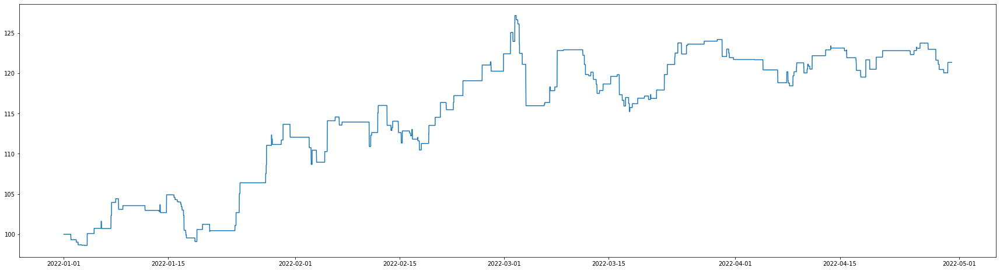

In [18]:
if reinvest_profit_flag == True:
    fig, ax = plt.subplots(figsize=(30, 8))
    ax.plot(budget_dict['time'], budget_dict['budget'])
else:
    print("Not reinvest profit")

In [19]:
if reinvest_profit_flag == True:
    print(f"Max drawdown: {round(max_drawdown * 100, 2)}%")

Max drawdown: 4.68%


In [20]:
win_rate = len(transaction_df[transaction_df['profit'] > 0]) / len(transaction_df)
print(f"Win rate: {round(win_rate * 100, 2)}%")

Win rate: 41.89%


In [21]:
for symbol in transaction_df['symbol'].unique():
    symbol_df = transaction_df[transaction_df['symbol'] == symbol]
    win_rate = len(symbol_df[symbol_df['profit'] > 0]) / len(symbol_df)
    print(f"{symbol} win rate: {round(win_rate * 100, 2)}%")

ETH-PERP win rate: 36.73%
LUNA-PERP win rate: 47.44%
SOL-PERP win rate: 42.7%


In [22]:
print(f"Distribution")
print(pd.DataFrame(transaction_df['profit_percent'].describe()))

Distribution
       profit_percent
count      265.000000
mean        -0.279926
std          2.145584
min         -4.814447
25%         -1.833707
50%         -0.746739
75%          1.281724
max          5.202311


In [23]:
for symbol in transaction_df['symbol'].unique():
    temp_return = transaction_df[transaction_df['symbol'] == symbol]['profit_percent']
    
    print(f"Distribution {symbol}:")
    print(pd.DataFrame(temp_return.describe()))
    print("\n")

Distribution ETH-PERP:
       profit_percent
count       98.000000
mean        -0.378521
std          1.770037
min         -4.327392
25%         -1.623312
50%         -0.871541
75%          0.872678
max          4.853103


Distribution LUNA-PERP:
       profit_percent
count       78.000000
mean        -0.253087
std          2.266013
min         -4.364631
25%         -2.081282
50%         -0.052437
75%          1.624553
max          4.293517


Distribution SOL-PERP:
       profit_percent
count       89.000000
mean        -0.194882
std          2.417725
min         -4.814447
25%         -1.829618
50%         -0.915923
75%          1.519737
max          5.202311


